In [74]:
import os
from pathlib import Path
import scanpy as sc
from scipy.sparse import issparse
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.mixture import GaussianMixture

import session_info
import sys

In [2]:
plt.rcParams['figure.figsize'] = (3, 3)
#plt.rcParams['figure.dpi'] = 300

In [7]:
base_dir = Path('/home/workspace/projects/drg')

input_dir = base_dir / "data/h5ad/export_03/03_neuron-scanvi"
#output_dir = base_dir / "data/h5ad/export_03/02_neuron-labels"

#output_dir.mkdir(parents=True, exist_ok=True)

## Read data

In [8]:
adata = sc.read_h5ad(os.path.join(input_dir, 'neuron-scanvi-labels.h5ad'))
adata

AnnData object with n_obs × n_vars = 37176 × 212
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'output_id', 'xenium_run_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'nuclear_fraction', 'doublet_scores', 'predicted_doublets', 'batch', 'slide', '_scvi_batch', '_scvi_labels', 'scvi_model', 'leiden_scVI_1', 'cell_class', 'neuron_recluster', 'scanvi_labels'
    var: 'Ensembl ID', 'Probesets', 'zhen_list', 'spectral_panel', 'neurons_supervised', 'neurons_unsupervised', 'glia_supervised', 'glia_unsupervised', 'other', 'neuron_DEGs', 'neuron_detection_rate', 'glia_detection_rate', 'combined_detection_rate

In [30]:
ref_data_dir = '/home/workspace/private/projects/kim/drg/data/scrna-seq/h5ad/04_clustered'
refdata = sc.read_h5ad(os.path.join(ref_data_dir, 'GSE139088-scvi-leiden.h5ad'))

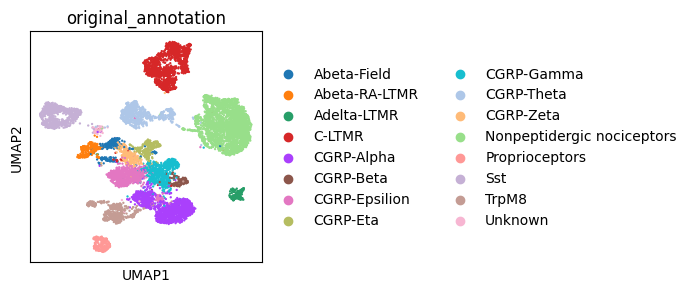

In [32]:
sc.pl.umap(refdata, color= 'original_annotation')

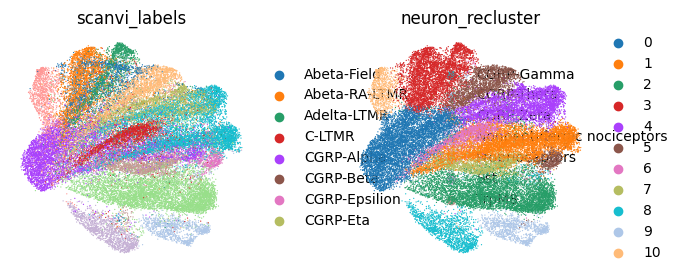

In [33]:
plt.rcParams['figure.figsize'] = (3, 3)
sc.pl.umap(adata, color = ['scanvi_labels', 'neuron_recluster'], frameon = False)

In [35]:
pd.crosstab(
    adata.obs['neuron_recluster'],
    adata.obs['scanvi_labels'],
    normalize='index'  # or remove normalize to see raw counts
).round(2)

scanvi_labels,Abeta-Field,Abeta-RA-LTMR,Adelta-LTMR,C-LTMR,CGRP-Alpha,CGRP-Beta,CGRP-Epsilion,CGRP-Eta,CGRP-Gamma,CGRP-Theta,CGRP-Zeta,Nonpeptidergic nociceptors,Proprioceptors,Sst,TrpM8
neuron_recluster,,,,,,,,,,,,,,,
0,0.02,0.07,0.03,0.01,0.54,0.00,0.01,0.07,0.05,0.00,0.07,0.02,0.07,0.00,0.03
1,0.00,0.00,0.00,0.02,0.24,0.02,0.07,0.01,0.57,0.01,0.01,0.02,0.00,0.00,0.02
2,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.01,0.01,0.00,0.00,0.95,0.00,0.00,0.00
3,0.24,0.42,0.27,0.01,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.00,0.01
4,0.02,0.01,0.01,0.01,0.01,0.00,0.00,0.44,0.48,0.00,0.01,0.01,0.00,0.00,0.01
5,0.08,0.00,0.00,0.01,0.01,0.00,0.18,0.02,0.03,0.01,0.65,0.02,0.00,0.00,0.00
6,0.00,0.00,0.00,0.95,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.02,0.00,0.00,0.01
7,0.00,0.00,0.00,0.01,0.04,0.01,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.89
8,0.00,0.00,0.00,0.01,0.02,0.00,0.01,0.00,0.01,0.01,0.00,0.05,0.00,0.84,0.03


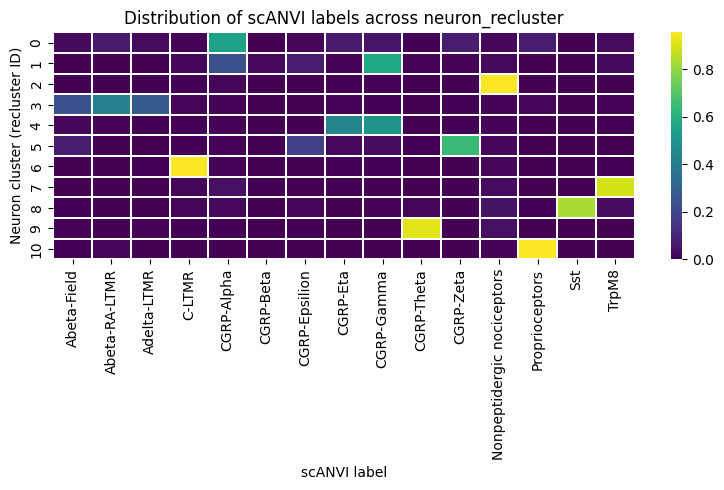

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

ct = pd.crosstab(adata.obs['neuron_recluster'], adata.obs['scanvi_labels'])
ct = ct.div(ct.sum(axis=1), axis=0)  # normalize per cluster

plt.figure(figsize=(8, 5))
sns.heatmap(ct, cmap="viridis", linewidths=0.3)
plt.title("Distribution of scANVI labels across neuron_recluster")
plt.ylabel("Neuron cluster (recluster ID)")
plt.xlabel("scANVI label")
plt.tight_layout()
plt.show()

Found in adata: ['bpoikicj-1-1', 'akcoadof-1-2', 'bgmdeeeb-1-2', 'hjjgalia-1-2', 'bmjgagok-1-3', 'ijnggkoc-1-3']


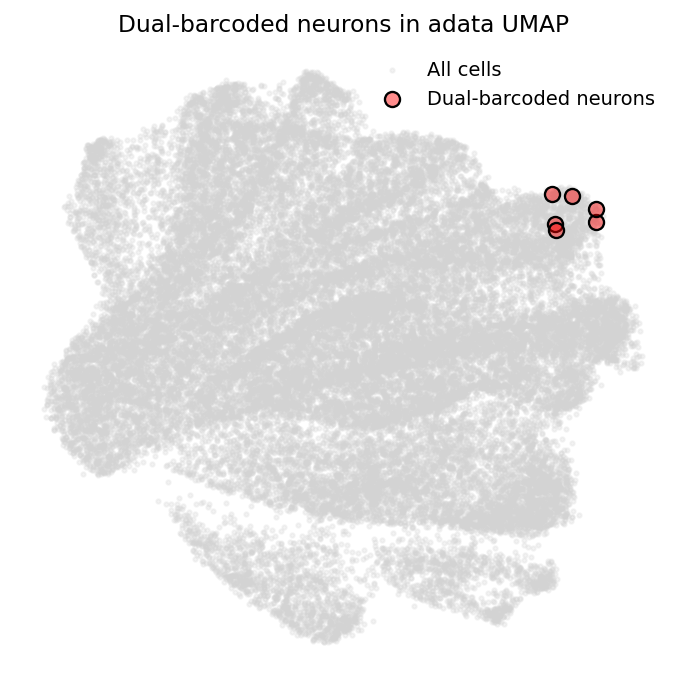

In [15]:
import seaborn as sns
# List of barcoded neurons
dual_barcodes = [
    'bpoikicj-1-1',
    'akcoadof-1-2',
    'bgmdeeeb-1-2',
    'hjjgalia-1-2',
    'bmjgagok-1-3',
    'ijnggkoc-1-3'
]

# Make sure these exist in adata
dual_mask = adata.obs_names.isin(dual_barcodes)

print("Found in adata:", adata.obs_names[dual_mask].tolist())

# Convert barcodes to integer indices
dual_indices = [adata.obs_names.get_loc(cell) for cell in adata.obs_names[dual_mask]]

# UMAP coordinates
umap = adata.obsm["X_umap"]

# Visualization
plt.figure(figsize=(5, 5), dpi=140)

# Background cells
plt.scatter(
    umap[:, 0],
    umap[:, 1],
    c="lightgray",
    s=5, alpha=0.25,
    label="All cells"
)

# Highlight dual-barcoded neurons
plt.scatter(
    umap[dual_indices, 0],
    umap[dual_indices, 1],
    s=60,
    facecolors=(1, 0, 0, 0.45),  # translucent red fill
    edgecolors="black",
    linewidths=1.2,
    marker="o",
    label="Dual-barcoded neurons"
)

plt.title("Dual-barcoded neurons in adata UMAP")
plt.xticks([]); plt.yticks([])
plt.legend(frameon=False)
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()


 Dual-barcoded neuron scanvi label assignments
bpoikicj-1-1         > CGRP-Gamma
akcoadof-1-2         > CGRP-Gamma
bgmdeeeb-1-2         > CGRP-Gamma
hjjgalia-1-2         > CGRP-Gamma
bmjgagok-1-3         > CGRP-Gamma
ijnggkoc-1-3         > CGRP-Gamma

 Summary: counts per label
scanvi_labels
CGRP-Gamma                    6
Abeta-Field                   0
Abeta-RA-LTMR                 0
Adelta-LTMR                   0
C-LTMR                        0
CGRP-Alpha                    0
CGRP-Beta                     0
CGRP-Epsilion                 0
CGRP-Eta                      0
CGRP-Theta                    0
CGRP-Zeta                     0
Nonpeptidergic nociceptors    0
Proprioceptors                0
Sst                           0
TrpM8                         0
Name: count, dtype: int64


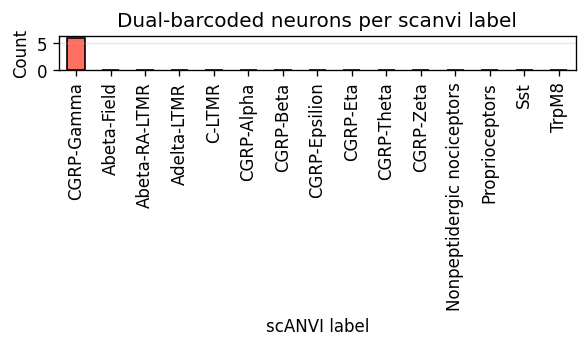

In [16]:
# --- Cluster summary for dual-barcoded neurons (using scanvi_labels) ---

if "scanvi_labels" in adata.obs.columns:
    clusters = adata.obs.loc[dual_mask, "scanvi_labels"]

    print("\n Dual-barcoded neuron scanvi label assignments")
    for cell, cluster in zip(adata.obs_names[dual_mask], clusters):
        print(f"{cell:<20} > {cluster}")

    # Summarize counts by label
    cluster_counts = clusters.value_counts()
    print("\n Summary: counts per label")
    print(cluster_counts)

    # Optional quick visualization
    plt.figure(figsize=(5, 3), dpi=120)
    cluster_counts.plot(kind="bar", color="#ff6f61", edgecolor="black")
    plt.title("Dual-barcoded neurons per scanvi label")
    plt.ylabel("Count")
    plt.xlabel("scANVI label")
    plt.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nColumn 'scanvi_labels' not found in adata.obs")

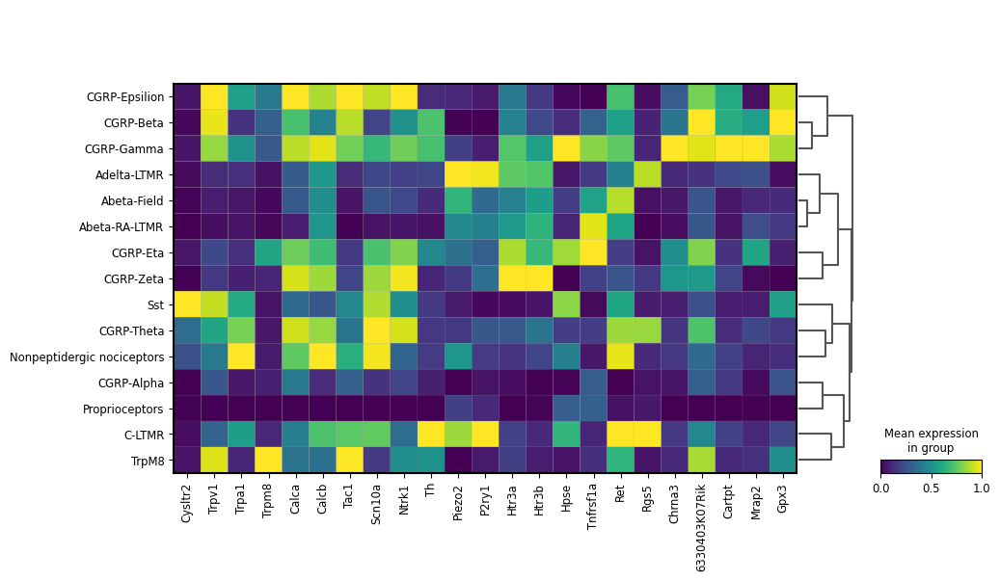

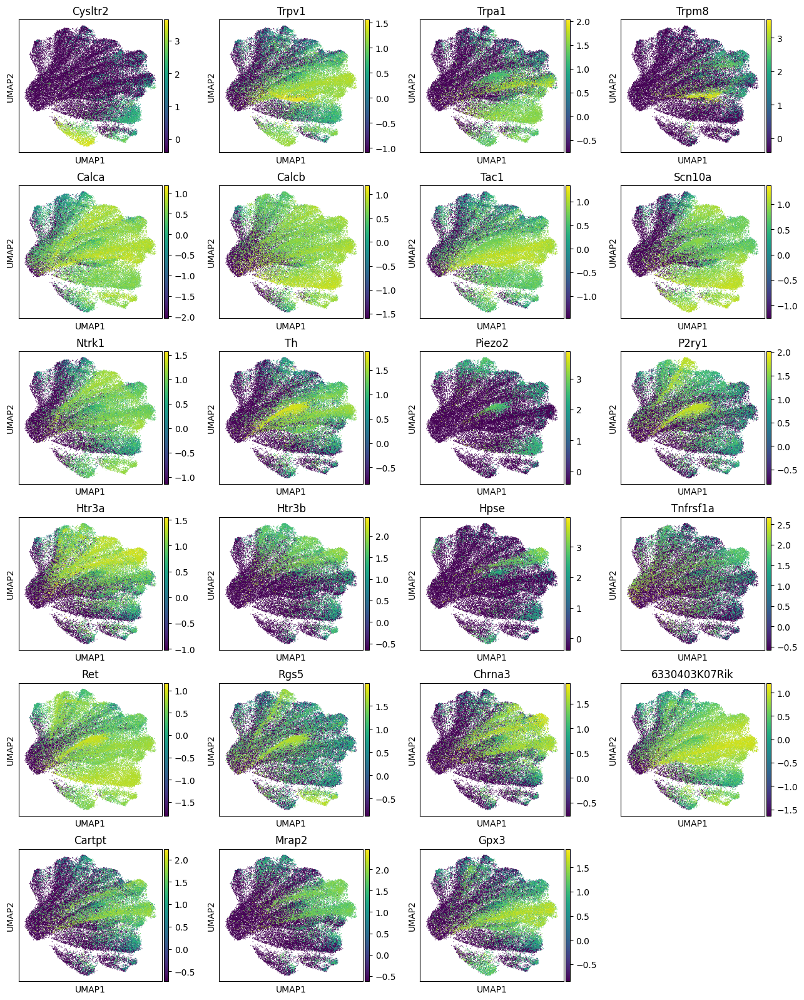

In [29]:
genes = ['Cysltr2', 'Trpv1', 'Trpa1', 'Trpm8', 'Calca', 'Calcb', 'Tac1', 'Scn10a', 'Ntrk1', 'Th', 'Piezo2', 'P2ry1', 'Htr3a', 'Htr3b', 'Hpse', 'Tnfrsf1a', 'Ret', 'Rgs5',
        'Chrna3', '6330403K07Rik', 'Cartpt', 'Mrap2', 'Gpx3']
sc.pl.matrixplot(adata, var_names = genes, groupby = 'scanvi_labels', standard_scale = 'var', dendrogram = True, use_raw = False)
sc.pl.umap(adata, color = genes, use_raw = False)

/home/workspace/environment/sc-charter/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/workspace/environment/sc-charter/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/workspace/environment/sc-charter/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/workspace/environment/sc-charter/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/workspace/environment/sc-charter/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in

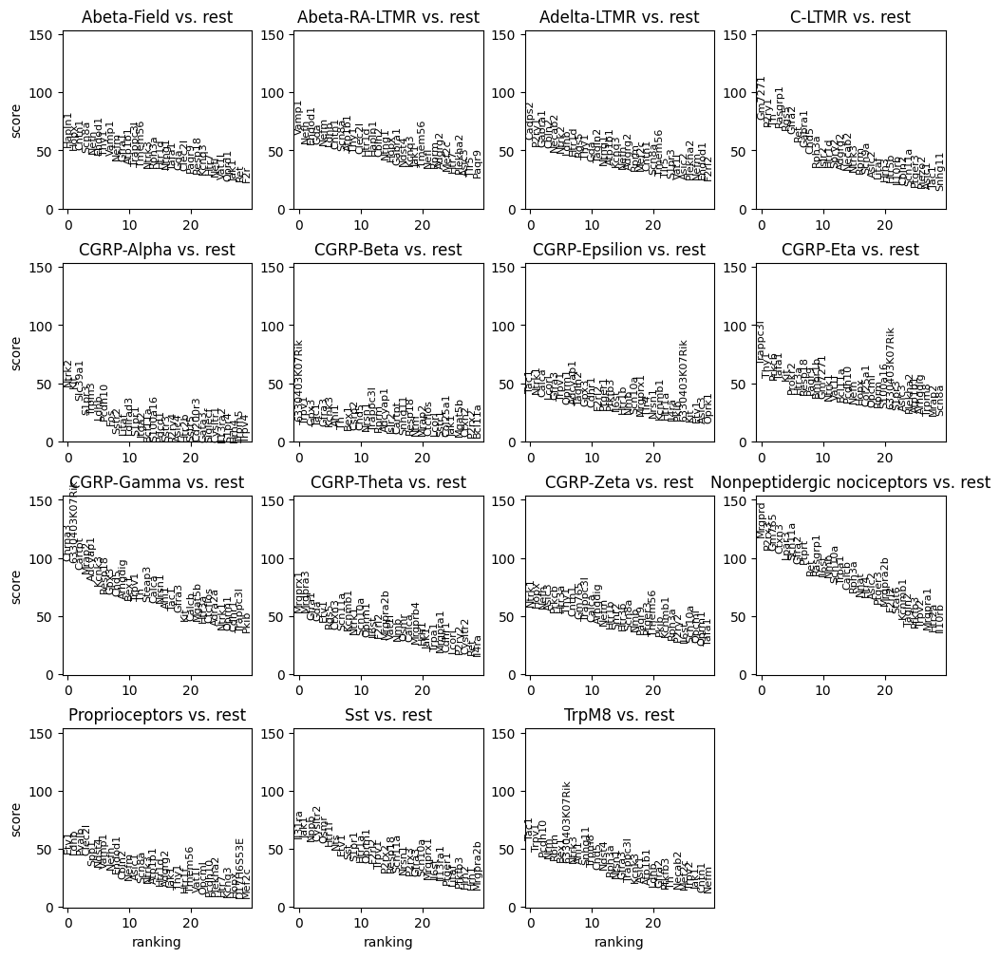

In [20]:
sc.tl.rank_genes_groups(adata, groupby="scanvi_labels", method="wilcoxon", use_raw = False)
sc.pl.rank_genes_groups(adata, groupby="scanvi_labels", n_genes=30, size=8, use_raw = False)

# Refdata scoring

In [37]:
refdata

AnnData object with n_obs × n_vars = 10729 × 20924
    obs: 'original_annotation', 'GSE', 'GSM', 'sample_number', 'sample_id', 'experiment_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribosomal', 'pct_counts_ribosomal', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'mt', 'ribosomal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'original_annotation_colors', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p', 'normalized_1e6'
    obsp: 'connectivities', 'distances'

In [38]:
common_genes = list(set(adata.var_names) & set(refdata.var_names))
len(common_genes)

208

In [39]:
# Create copies of the datasets, keeping only common genes
adata_subset = adata[:, common_genes].copy()
refdata_subset = refdata[:, common_genes].copy()

In [42]:
adata_subset.X = adata_subset.layers['log1p'].copy()
refdata_subset.X = refdata_subset.layers['log1p'].copy()

In [43]:
sc.tl.rank_genes_groups(
    refdata_subset,
    groupby='original_annotation',
    method='wilcoxon',
    use_raw=False
)

# Convert results to a tidy DataFrame
markers_df = sc.get.rank_genes_groups_df(refdata_subset, None)

# Get top 10 genes per annotation
top10_markers = (
    markers_df
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(10)
    .reset_index(drop=True)
)

top10_markers.head(20)

/tmp/ipykernel_7632/3958429039.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,Abeta-Field,Cntn1,25.320244,7.051589,1.912032e-141,3.977027e-139
1,Abeta-Field,Nefh,24.995878,5.361016,6.777963e-138,7.049082e-136
2,Abeta-Field,Tmem56,23.948195,5.478737,9.649114e-127,6.690052e-125
3,Abeta-Field,Nefm,23.917501,3.902427,2.014074e-126,1.047319e-124
4,Abeta-Field,Thy1,23.618092,8.041372,2.512469e-123,1.045187e-121
5,Abeta-Field,Atp1b1,23.458611,3.976768,1.079782e-121,3.743244e-120
6,Abeta-Field,Nefl,23.368530,2.017396,8.932324e-121,2.654176e-119
7,Abeta-Field,Endod1,21.881832,3.693029,3.869823e-106,1.006154e-104
8,Abeta-Field,Scn8a,21.286957,5.894128,1.499563e-100,3.465657e-99
9,Abeta-Field,Paqr9,19.751337,4.753210,7.812258e-87,1.624950e-85


In [48]:
gene_sets = (
    top10_markers.groupby("group")["names"]
    .apply(list)
    .to_dict()
)

# Score each group’s gene set on your reference AnnData
for group, genes in gene_sets.items():
    valid_genes = [g for g in genes if g in refdata_subset.var_names]
    if len(valid_genes) == 0:
        print(f"No valid genes for {group}")
        continue

    score_name = f"score_{group.replace(' ', '_')}"
    sc.tl.score_genes(refdata_subset, gene_list=valid_genes, score_name=score_name)

    print(f"Added {score_name} using {len(valid_genes)} genes")

/tmp/ipykernel_7632/2260657899.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  top10_markers.groupby("group")["names"]


Added score_Abeta-Field using 10 genes
Added score_Abeta-RA-LTMR using 10 genes
Added score_Adelta-LTMR using 10 genes
Added score_C-LTMR using 10 genes
Added score_CGRP-Alpha using 10 genes
Added score_CGRP-Beta using 10 genes
Added score_CGRP-Epsilion using 10 genes
Added score_CGRP-Eta using 10 genes
Added score_CGRP-Gamma using 10 genes
Added score_CGRP-Theta using 10 genes
Added score_CGRP-Zeta using 10 genes
Added score_Nonpeptidergic_nociceptors using 10 genes
Added score_Proprioceptors using 10 genes
Added score_Sst using 10 genes
Added score_TrpM8 using 10 genes
Added score_Unknown using 10 genes


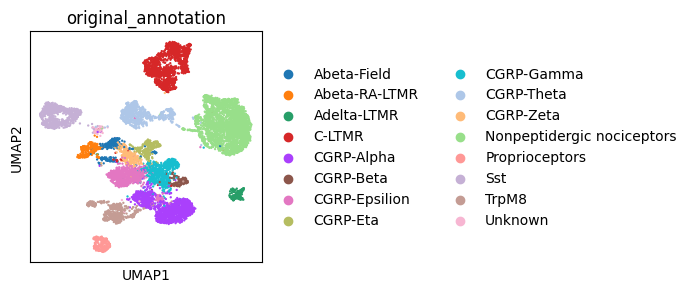

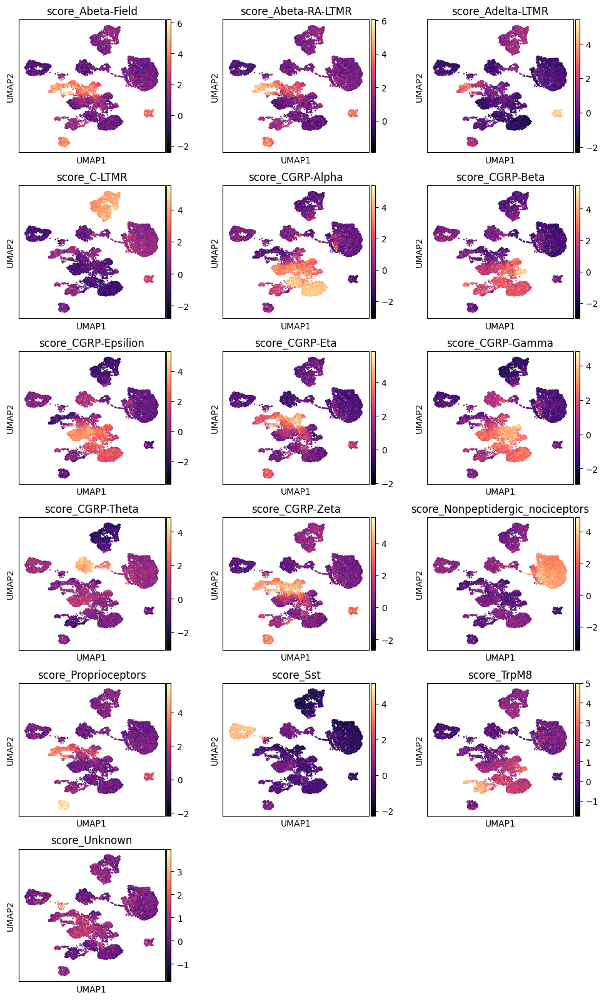

In [46]:
sc.pl.umap(refdata, color = 'original_annotation')

sc.pl.umap(
    refdata_subset,
    color=[f"score_{g.replace(' ', '_')}" for g in gene_sets.keys()],
    cmap="magma",
    ncols=3
)

In [47]:
# View markers for CGRP-Gamma
cgrp_gamma_markers = top10_markers[top10_markers["group"] == "CGRP-Gamma"]
cgrp_gamma_markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
80,CGRP-Gamma,Vat1l,39.339188,6.692978,0.000000e+00,0.000000e+00
81,CGRP-Gamma,Arhgdig,35.870403,2.695943,8.843224e-282,9.196953e-280
82,CGRP-Gamma,Adcyap1,33.336334,6.575043,1.149438e-243,7.969438e-242
83,CGRP-Gamma,Kit,31.370651,5.820358,5.087805e-216,2.645659e-214
84,CGRP-Gamma,Trpv1,31.260138,5.030663,1.625677e-214,6.762815e-213
85,CGRP-Gamma,Cartpt,29.447609,6.189952,1.350895e-190,4.683103e-189
86,CGRP-Gamma,Calca,28.482748,4.234810,1.916249e-178,5.693997e-177
87,CGRP-Gamma,6330403K07Rik,28.072805,4.327278,2.104631e-173,5.472041e-172
88,CGRP-Gamma,Kcnk3,26.277748,5.030226,3.445159e-152,7.962144e-151
89,CGRP-Gamma,Cdhr1,25.930058,4.870489,3.052574e-148,6.349354e-147


Plotting 10 common CGRP-Gamma markers...


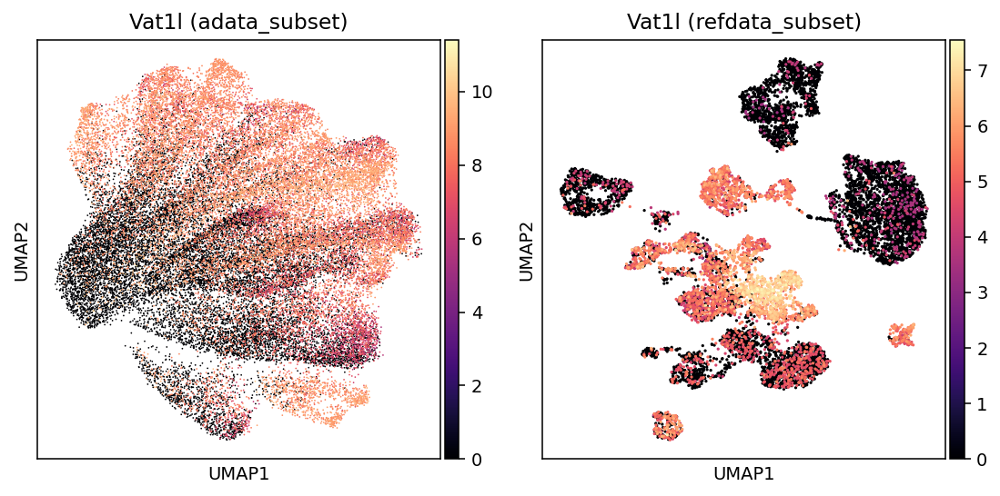

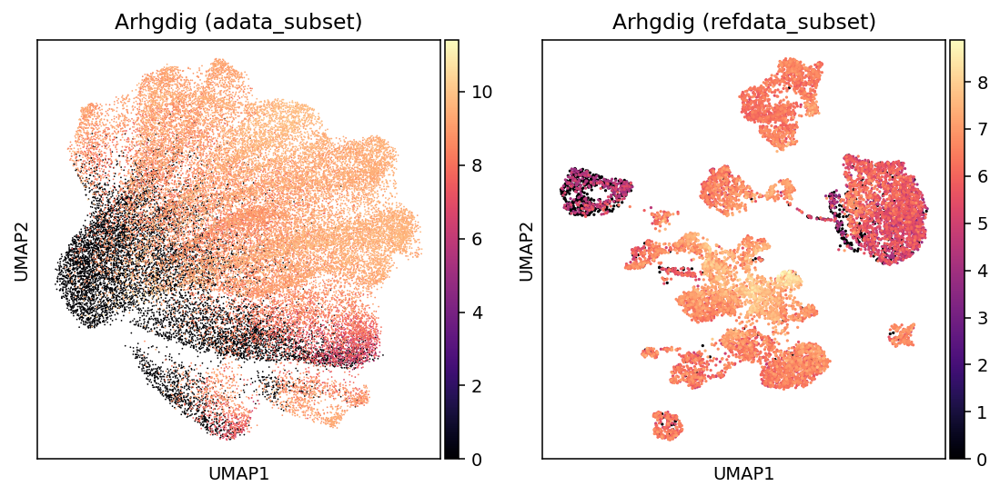

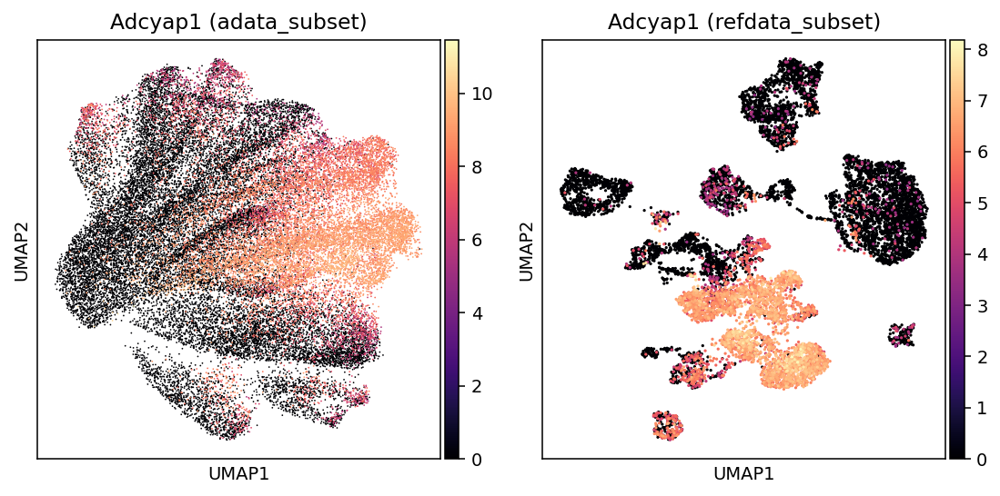

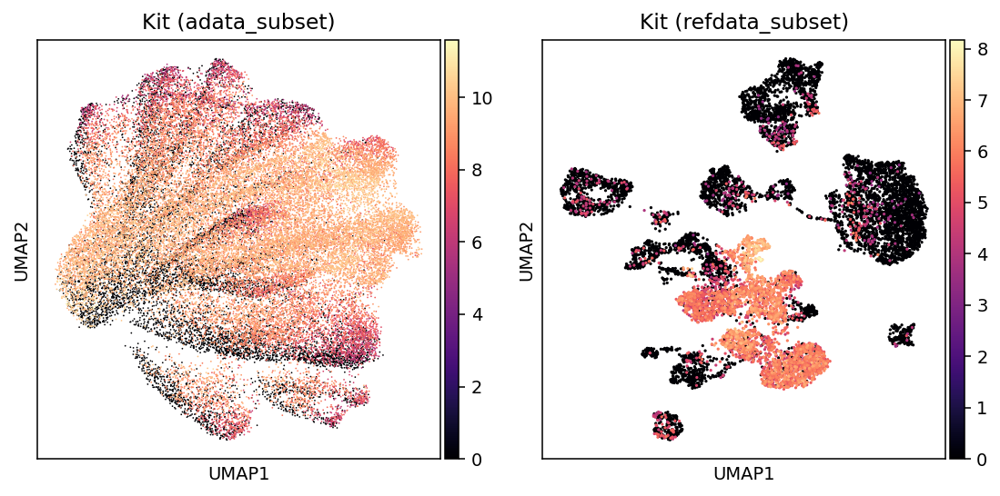

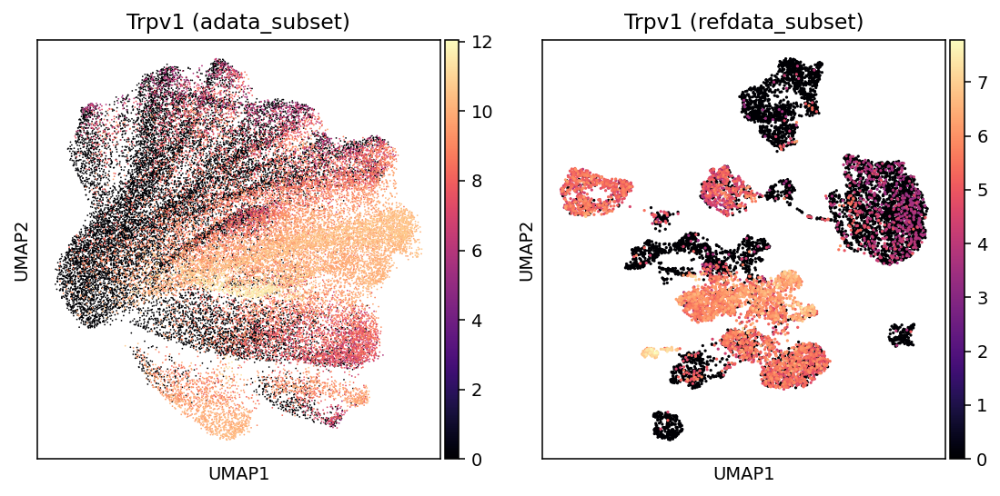

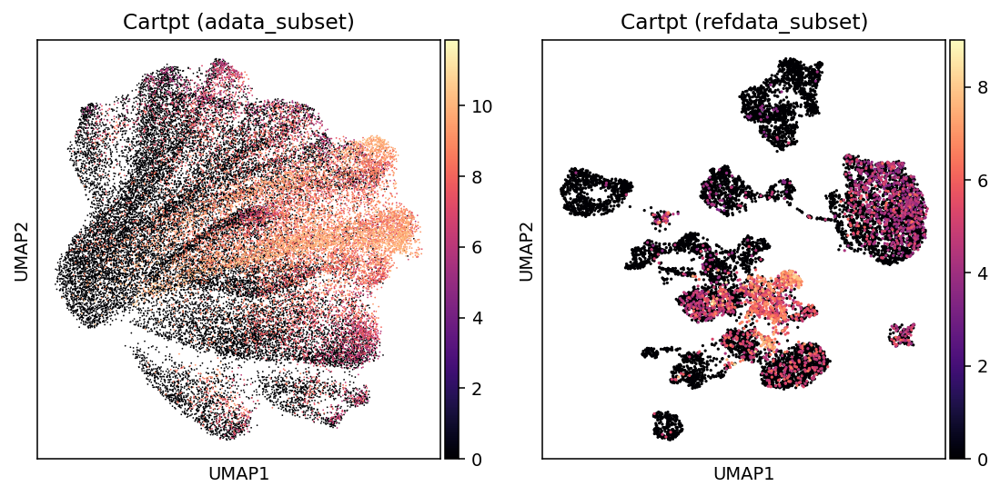

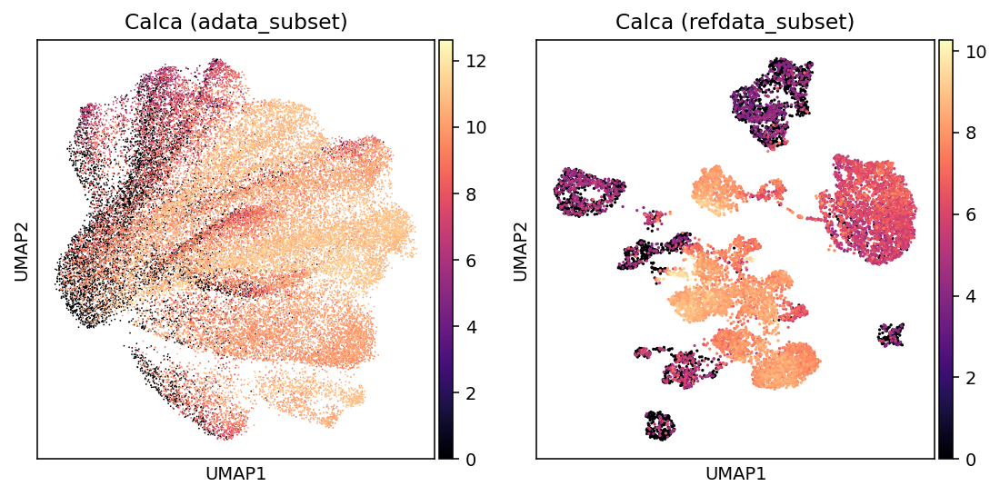

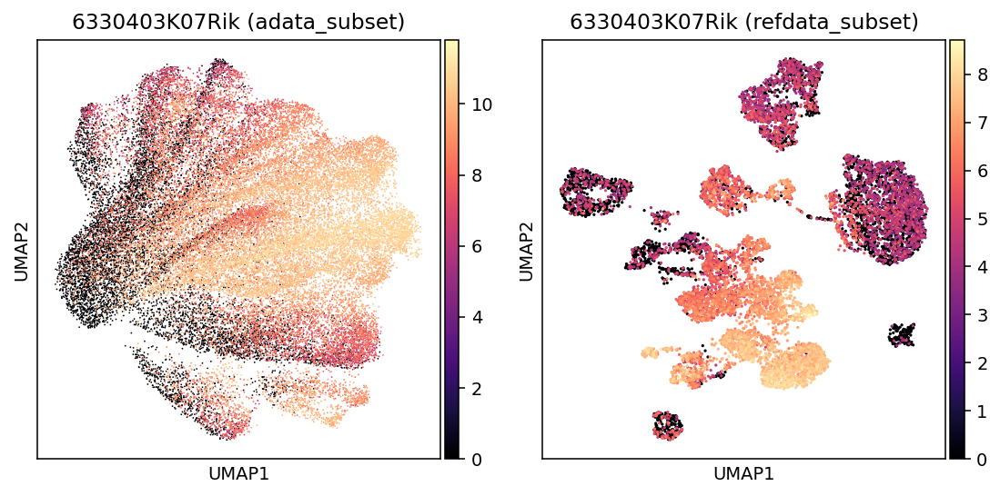

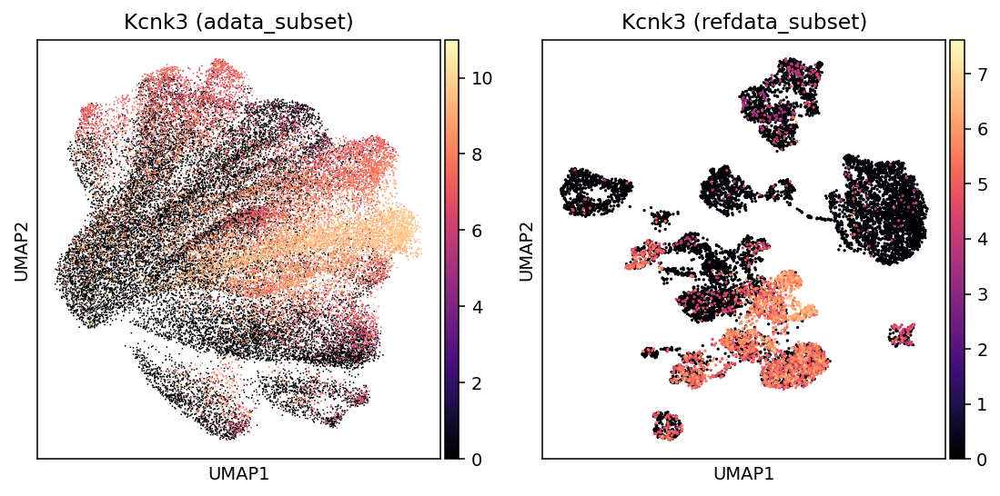

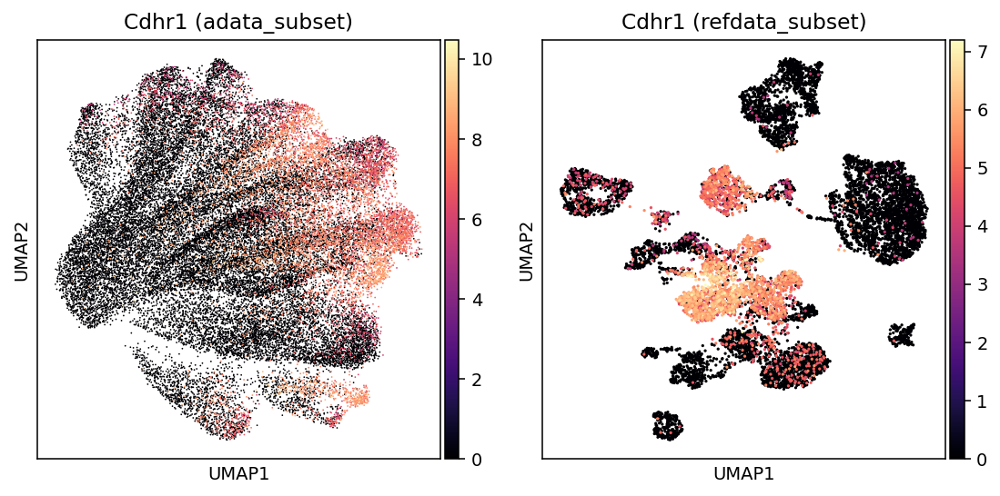

In [49]:
# Get the CGRP-Gamma marker list
cgrp_gamma_markers = top10_markers[top10_markers["group"] == "CGRP-Gamma"]["names"].tolist()

# Filter to genes that exist in both datasets
valid_genes = [g for g in cgrp_gamma_markers if g in adata_subset.var_names and g in refdata_subset.var_names]
print(f"Plotting {len(valid_genes)} common CGRP-Gamma markers...")

# Plot UMAPs for both datasets
for gene in valid_genes:
    fig, axes = plt.subplots(1, 2, figsize=(8, 4), dpi=140)

    # Left: Xenium data (adata_subset)
    sc.pl.umap(
        adata_subset,
        color=gene,
        ax=axes[0],
        show=False,
        cmap="magma",
        title=f"{gene} (adata_subset)"
    )

    # Right: Reference seq data (refdata_subset)
    sc.pl.umap(
        refdata_subset,
        color=gene,
        ax=axes[1],
        show=False,
        cmap="magma",
        title=f"{gene} (refdata_subset)"
    )

    plt.tight_layout()
    plt.show()

In [53]:
adata_subset.obs.columns

Index(['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts',
       'control_probe_counts', 'genomic_control_counts',
       'control_codeword_counts', 'unassigned_codeword_counts',
       'deprecated_codeword_counts', 'total_counts', 'cell_area',
       'nucleus_area', 'nucleus_count', 'segmentation_method', 'output_id',
       'xenium_run_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'log1p_total_counts', 'pct_counts_in_top_10_genes',
       'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_150_genes', 'nuclear_fraction', 'doublet_scores',
       'predicted_doublets', 'batch', 'slide', '_scvi_batch', '_scvi_labels',
       'scvi_model', 'leiden_scVI_1', 'cell_class', 'neuron_recluster',
       'scanvi_labels'],
      dtype='object')

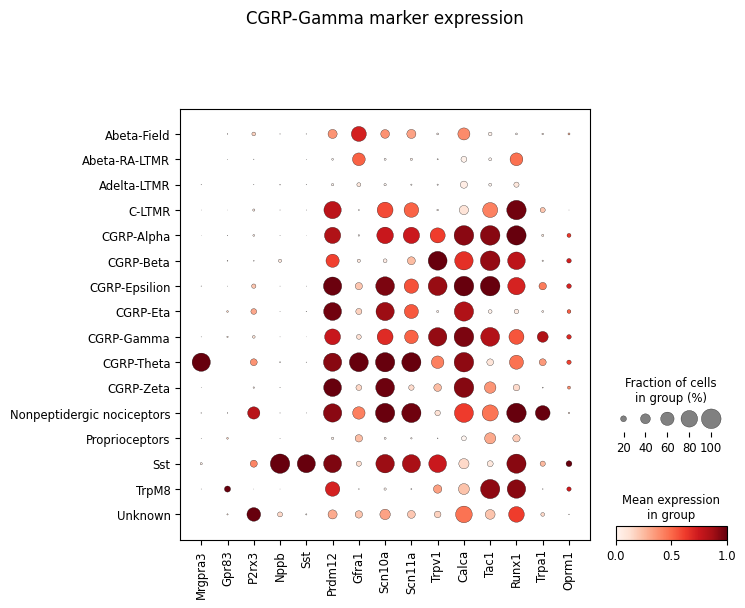

In [58]:
np3_markers = [
    "Mrgpra3",  # defining receptor
    "Gpr83",
    "P2rx3",
    "Nppb",
    "Sst",
    "Prdm12",
    "Gfra1",
    "Scn10a",
    "Scn11a",
    "Trpv1",
    "Calca",     # sometimes low
    "Tac1",      # low to absent
    "Runx1",     # developmental marker
    "Trpa1",     # subset
    "Oprm1"      # subset expression
]
# --- Visualize marker expression ---
sc.pl.dotplot(
    refdata_subset,
    var_names=np3_markers,
    groupby="original_annotation",
    standard_scale="var",
    dendrogram=False,
    title="CGRP-Gamma marker expression"
)

/tmp/ipykernel_7632/1059589068.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ref_markers.groupby("group")["names"]


Extracted 16 marker gene sets from refdata_subset
Added score_Abeta-Field using 10 valid genes
Added score_Abeta-RA-LTMR using 10 valid genes
Added score_Adelta-LTMR using 10 valid genes
Added score_C-LTMR using 10 valid genes
Added score_CGRP-Alpha using 10 valid genes
Added score_CGRP-Beta using 10 valid genes
Added score_CGRP-Epsilion using 10 valid genes
Added score_CGRP-Eta using 10 valid genes
Added score_CGRP-Gamma using 10 valid genes
Added score_CGRP-Theta using 10 valid genes
Added score_CGRP-Zeta using 10 valid genes
Added score_Nonpeptidergic_nociceptors using 10 valid genes
Added score_Proprioceptors using 10 valid genes
Added score_Sst using 10 valid genes
Added score_TrpM8 using 10 valid genes
Added score_Unknown using 10 valid genes


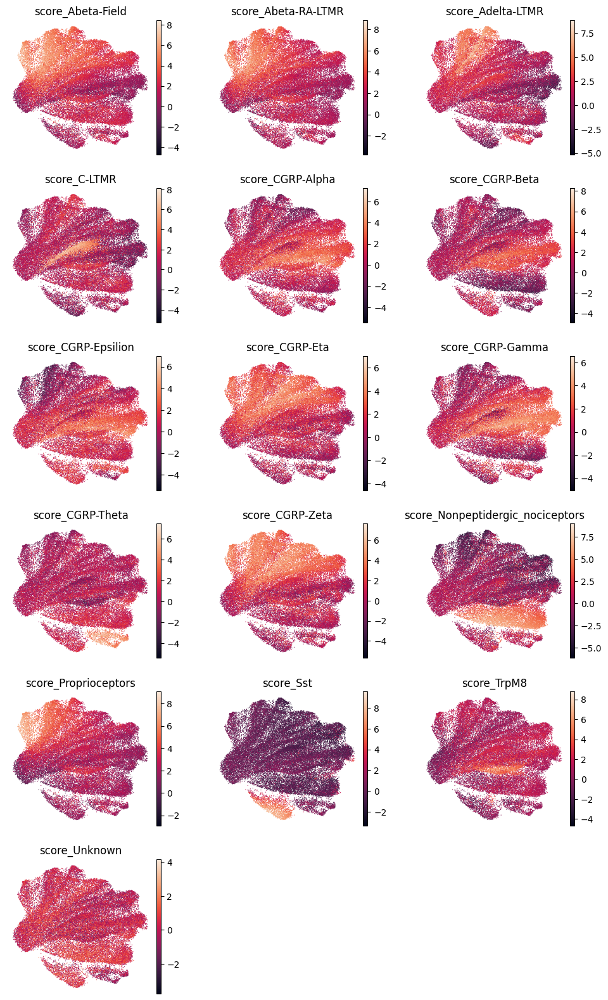

In [63]:
# --- 1. Identify top marker genes per cluster in refdata_subset ---
sc.tl.rank_genes_groups(
    refdata_subset,
    groupby="original_annotation",
    method="wilcoxon",
    n_genes=10,
    use_raw = False
)

# Convert results to DataFrame
ref_markers = sc.get.rank_genes_groups_df(refdata_subset, None)

# --- 2. Build dictionary of gene lists per cluster ---
gene_sets = (
    ref_markers.groupby("group")["names"]
    .apply(list)
    .to_dict()
)

print(f"Extracted {len(gene_sets)} marker gene sets from refdata_subset")

# --- 3. Score those gene sets in adata_subset ---
for group, genes in gene_sets.items():
    valid_genes = [g for g in genes if g in adata_subset.var_names]
    if not valid_genes:
        print(f"No valid genes found for {group}")
        continue

    score_name = f"score_{group.replace(' ', '_')}"
    sc.tl.score_genes(adata_subset, gene_list=valid_genes, score_name=score_name, use_raw = False)
    print(f"Added {score_name} using {len(valid_genes)} valid genes")

# --- 4. Visualize the transferred scores on adata_subset UMAP ---
sc.pl.umap(
    adata_subset,
    color=[f"score_{g.replace(' ', '_')}" for g in gene_sets.keys()],
    cmap="rocket",
    ncols=3,
    frameon=False,
    #vmin='p1', vmax='p99'
)

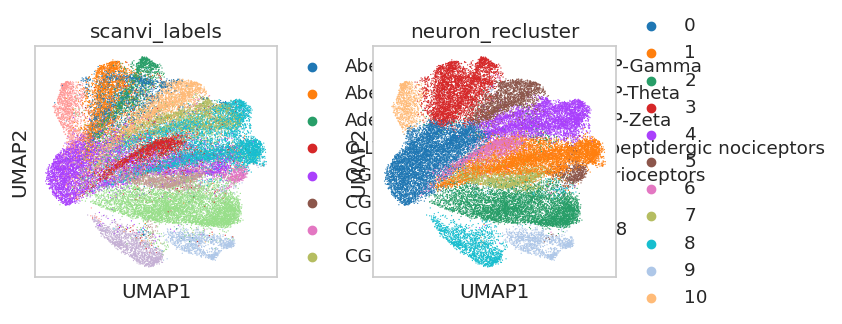

In [97]:
sc.pl.umap(adata_subset, color = ['scanvi_labels', 'neuron_recluster'])

In [89]:
input_dir = base_dir / "data/h5ad/export_02/03_annotated"
adata=sc.read_h5ad(os.path.join(input_dir, 'ModelA_whole_all_annotated.h5ad'))

In [90]:
adata.X = adata.layers['counts'].copy()
adata.X[:5, :5].toarray()

array([[ 0.,  2.,  0.,  2.,  0.],
       [ 3., 20.,  1., 25.,  0.],
       [ 1.,  1.,  5., 13.,  0.],
       [ 0.,  1.,  0.,  0.,  0.],
       [ 0.,  4.,  0.,  9.,  0.]], dtype=float32)

In [93]:
genes = ['EGFP_Seq1', 'tdTomato_Seq2']
n_components = 3
prob_threshold = 0.99
within_cluster_q = 0.99

def to_dense(x):
    return x.toarray().ravel() if hasattr(x, "toarray") else np.ravel(x)

gmm_results = {}

for g in genes:
    x = to_dense(adata[:, g].X)
    x_log = np.log1p(x).reshape(-1, 1)

    gmm = GaussianMixture(n_components=n_components, random_state=0).fit(x_log)
    probs = gmm.predict_proba(x_log)
    means = gmm.means_.flatten()
    high_cluster = np.argmax(means)

    high_mask = probs[:, high_cluster] > prob_threshold
    x_high = x[high_mask]

    thr_expr = np.percentile(x_high, within_cluster_q * 100) if x_high.size > 0 else np.expm1(means[high_cluster])
    hi_mask = high_mask & (x > thr_expr)

    adata.obs[f"{g}_hi"] = hi_mask

    # store all useful things for later plotting
    gmm_results[g] = {
        "gmm": gmm,
        "x": x,
        "x_log": x_log,
        "means": means,
        "covars": gmm.covariances_.flatten(),
        "weights": gmm.weights_.flatten(),
        "high_cluster": high_cluster,
        "high_mask": high_mask,
        "thr_expr": thr_expr,
    }

    print(f"{g}: high_cluster_mean={np.expm1(means[high_cluster]):.2f}, "
          f"thr={thr_expr:.2f}, n_hi={hi_mask.sum()} ({100*hi_mask.mean():.4f}%)")

adata.obs['EGFP_tdTomato_dual_hi'] = adata.obs['EGFP_Seq1_hi'] & adata.obs['tdTomato_Seq2_hi']
n_dual = adata.obs['EGFP_tdTomato_dual_hi'].sum()
print(f"\nUltra-strict dual positives: {n_dual}/{adata.n_obs} ({100*n_dual/adata.n_obs:.4f}%)")

EGFP_Seq1: high_cluster_mean=3.79, thr=15.00, n_hi=358 (0.3690%)
tdTomato_Seq2: high_cluster_mean=2.50, thr=17.28, n_hi=42 (0.0433%)

Ultra-strict dual positives: 6/97027 (0.0062%)


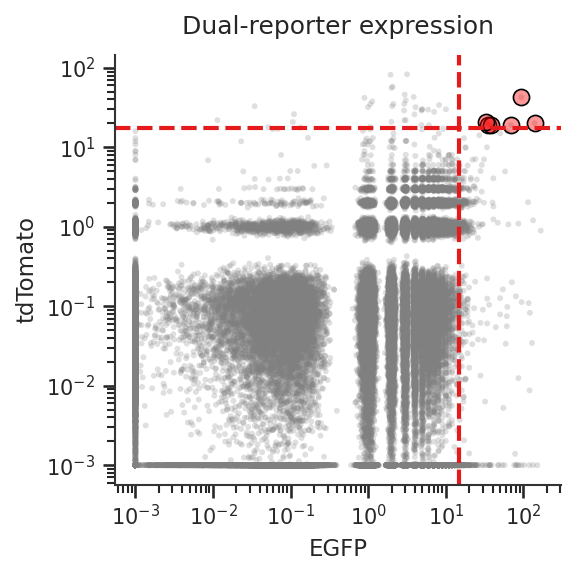

In [171]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# thresholds
thr_egfp = gmm_results["EGFP_Seq1"]["thr_expr"]
thr_td   = gmm_results["tdTomato_Seq2"]["thr_expr"]

def to_dense(x):
    return x.toarray().ravel() if hasattr(x, "toarray") else np.ravel(x)

# extract expression
x_egfp = to_dense(adata[:, "EGFP_Seq1"].X)
x_td   = to_dense(adata[:, "tdTomato_Seq2"].X)
dual   = adata.obs["EGFP_tdTomato_dual_hi"]

# jitter
rng = np.random.default_rng(0)
x_egfp_j = np.clip(x_egfp + rng.normal(scale=0.1, size=x_egfp.shape), 1e-3, None)
x_td_j   = np.clip(x_td   + rng.normal(scale=0.1, size=x_td.shape),   1e-3, None)

# theme
sns.set_theme(style="ticks")
plt.rcParams.update({
    "axes.edgecolor": "#333333",
    "axes.linewidth": 1,
    "font.size": 12,
    "font.weight": "normal",
    "axes.labelweight": "normal",
    "axes.titleweight": "normal",
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
})

fig, ax = plt.subplots(figsize=(4, 4), dpi=150)

# background (black points, faint)
ax.scatter(
    x_egfp_j, x_td_j,
    s=8,
    color="gray",
    alpha=0.25,
    edgecolor="none"
)

# dual-high (translucent red circles with black border)
ax.scatter(
    x_egfp_j[dual], x_td_j[dual],
    s=60,
    facecolors=(1, 0, 0, 0.4),
    edgecolors="black",
    linewidths=0.8,
    label="Dual-high cells"
)

# thresholds (bright red, thicker)
ax.axvline(thr_egfp, color="#e41a1c", ls="--", lw=2)
ax.axhline(thr_td,   color="#e41a1c", ls="--", lw=2)

# scales & labels
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("EGFP")
ax.set_ylabel("tdTomato")
ax.set_title("Dual-reporter expression", pad=10)

sns.despine()
plt.tight_layout()
plt.show()

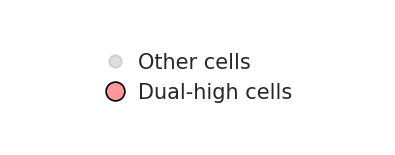

In [173]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

# --- Define circle markers for legend ---
normal_circle = mlines.Line2D(
    [], [], 
    color="gray",
    marker="o",
    markersize=6,
    linestyle="None",
    alpha=0.25,
    label="Other cells"
)

dual_circle = mlines.Line2D(
    [], [], 
    marker="o",
    markersize=9,
    linestyle="None",
    markerfacecolor=(1, 0, 0, 0.4),
    markeredgecolor="black",
    markeredgewidth=0.8,
    label="Dual-high cells"
)

# --- Plot only the legend ---
fig, ax = plt.subplots(figsize=(2.8, 1.2), dpi=150)
ax.axis("off")

ax.legend(
    handles=[normal_circle, dual_circle],
    loc="center",
    frameon=False,       # clean, no border
    fontsize=10,
    handlelength=1.0,
    handletextpad=0.6,
    labelspacing=0.5,
)

plt.tight_layout()
plt.show()

In [135]:
adata.obs.columns

Index(['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts',
       'control_probe_counts', 'genomic_control_counts',
       'control_codeword_counts', 'unassigned_codeword_counts',
       'deprecated_codeword_counts', 'total_counts', 'cell_area',
       'nucleus_area', 'nucleus_count', 'segmentation_method', 'output_id',
       'xenium_run_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'log1p_total_counts', 'pct_counts_in_top_10_genes',
       'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_150_genes', 'nuclear_fraction', 'doublet_scores',
       'predicted_doublets', 'batch', 'slide', '_scvi_batch', '_scvi_labels',
       'scvi_model', 'leiden_scVI_1', 'EGFP_Seq1_hi', 'tdTomato_Seq2_hi',
       'EGFP_tdTomato_dual_hi', 'scanvi_labels'],
      dtype='object')

In [138]:
input_dir = base_dir / "data/h5ad/export_03/03_neuron-scanvi"

bdata = sc.read_h5ad(os.path.join(input_dir, 'neuron-scanvi-labels.h5ad'))

In [139]:
# Copy neuron_recluster from bdata to adata by matching obs_names
adata.obs["neuron_recluster"] = (
    bdata.obs["neuron_recluster"]
    .reindex(adata.obs_names)
)

# Quick sanity check
n_matched = adata.obs["neuron_recluster"].notna().sum()
print(f"Transferred 'neuron_recluster' to adata ({n_matched} matched cells).")

Transferred 'neuron_recluster' to adata (37176 matched cells).


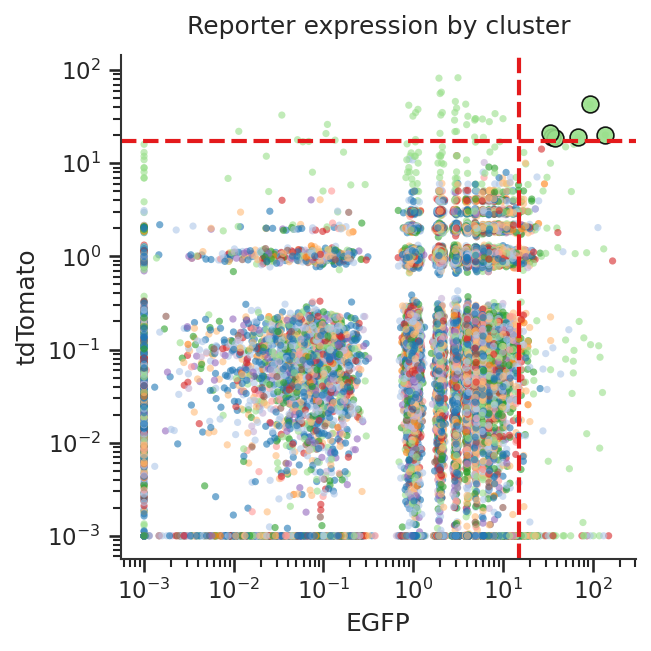

In [142]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# thresholds
thr_egfp = gmm_results["EGFP_Seq1"]["thr_expr"]
thr_td   = gmm_results["tdTomato_Seq2"]["thr_expr"]

def to_dense(x):
    return x.toarray().ravel() if hasattr(x, "toarray") else np.ravel(x)

# extract expression
x_egfp = to_dense(adata[:, "EGFP_Seq1"].X)
x_td   = to_dense(adata[:, "tdTomato_Seq2"].X)
dual   = adata.obs["EGFP_tdTomato_dual_hi"]
labels = adata.obs["neuron_recluster"]

# jitter
rng = np.random.default_rng(0)
x_egfp_j = np.clip(x_egfp + rng.normal(scale=0.1, size=x_egfp.shape), 1e-3, None)
x_td_j   = np.clip(x_td   + rng.normal(scale=0.1, size=x_td.shape),   1e-3, None)

# theme
sns.set_theme(style="ticks")
plt.rcParams.update({
    "axes.edgecolor": "#333333",
    "axes.linewidth": 1,
    "font.size": 12,
})

# color palette — perceptually distinct
unique_labels = sorted(labels.dropna().unique())
palette = sns.color_palette("tab20", n_colors=len(unique_labels))
color_map = dict(zip(unique_labels, palette))

fig, ax = plt.subplots(figsize=(4.5, 4.5), dpi=150)

# scatter, colored by neuron_recluster
sns.scatterplot(
    x=x_egfp_j,
    y=x_td_j,
    hue=labels,
    hue_order=unique_labels,
    palette=color_map,
    s=12,
    linewidth=0,
    alpha=0.6,
    ax=ax,
    legend=False
)

# dual-high cells (same color as their cluster, outlined)
for label in unique_labels:
    mask = dual & (labels == label)
    ax.scatter(
        x_egfp_j[mask],
        x_td_j[mask],
        s=65,
        facecolors=color_map[label],
        edgecolors="black",
        linewidths=0.8,
        alpha=0.9,
    )

# thresholds (bright red)
ax.axvline(thr_egfp, color="#e41a1c", ls="--", lw=2)
ax.axhline(thr_td,   color="#e41a1c", ls="--", lw=2)

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("EGFP")
ax.set_ylabel("tdTomato")
ax.set_title("Reporter expression by cluster", pad=10)

sns.despine()
plt.tight_layout()
plt.show()

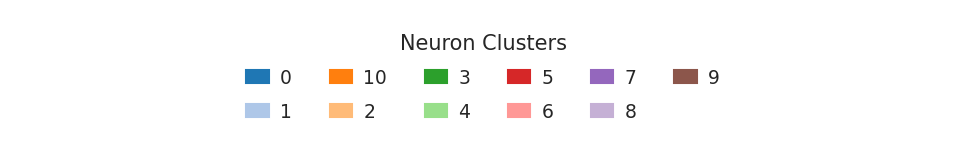

In [148]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import seaborn as sns

labels = adata.obs["neuron_recluster"].dropna()
unique_labels = sorted(labels.unique())

# palette
if len(unique_labels) <= 20:
    palette = sns.color_palette("tab20", n_colors=len(unique_labels))
else:
    palette = sns.color_palette("hsv", n_colors=len(unique_labels))

color_map = dict(zip(unique_labels, palette))
handles = [mpatches.Patch(color=color_map[l], label=l) for l in unique_labels]

# horizontal legend
fig, ax = plt.subplots(figsize=(0.6 * len(unique_labels), 1.2), dpi=150)
ax.axis("off")

ax.legend(
    handles=handles,
    loc="center",
    frameon=False,
    fontsize=9,
    handletextpad=0.6,
    handlelength=1.2,
    labelspacing=0.8,
    title="Neuron Clusters",
    title_fontsize=10,
    ncol=6,   # all in one row (horizontal)
)

plt.tight_layout()
plt.show()

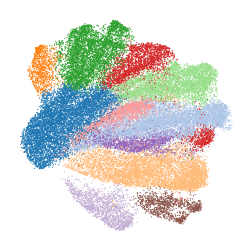

In [169]:
import scanpy as sc
import seaborn as sns

# --- Create color mapping from adata ---
labels = adata.obs["neuron_recluster"].astype("category")
unique_labels = sorted(labels.dropna().unique())

if len(unique_labels) <= 20:
    palette = sns.color_palette("tab20", n_colors=len(unique_labels))
else:
    palette = sns.color_palette("hsv", n_colors=len(unique_labels))

color_map = dict(zip(unique_labels, palette))

# --- Assign colors in bdata ---
bdata.obs["neuron_recluster"] = bdata.obs["neuron_recluster"].astype("category")
bdata.uns["neuron_recluster_colors"] = [
    color_map.get(label, "#d3d3d3")  # fallback to light gray if missing
    for label in bdata.obs["neuron_recluster"].cat.categories
]

# --- Plot ---
sc.pl.umap(
    bdata,
    color="neuron_recluster",
    frameon=False,
    alpha=0.95,
    #size=25,                     # slightly larger dots for smoother visuals
    legend_loc='none',        # labels directly on the clusters
    #legend_fontoutline=2,        # dark outline so text pops on light colors
    #legend_fontsize=10,
    #add_outline=True,            # soft outline to separate dense regions
    title = ''
)

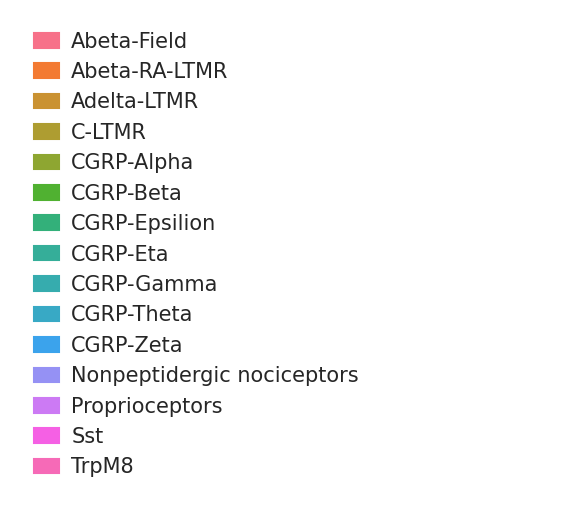

In [164]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import seaborn as sns

# Use the same color map from before
unique_labels = sorted(adata.obs["scanvi_labels"].dropna().unique())
palette = sns.color_palette("husl", n_colors=len(unique_labels))
color_map = dict(zip(unique_labels, palette))

# Create legend handles
handles = [
    mpatches.Patch(color=color_map[label], label=label)
    for label in unique_labels
]

# Plot legend only
fig, ax = plt.subplots(figsize=(4, 0.25 * len(unique_labels)), dpi=150)
ax.axis("off")

legend = ax.legend(
    handles=handles,
    loc="center left",
    frameon=False,           # no gray border
    fontsize=10,
    handletextpad=0.6,
    handlelength=1.2,
    labelspacing=0.5,
)

plt.tight_layout()
plt.show()

/tmp/ipykernel_7632/543610597.py:31: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



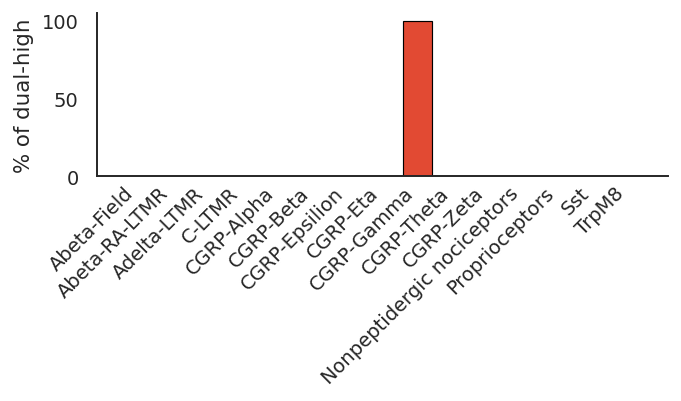

In [207]:
import matplotlib.pyplot as plt

dual_mask = adata.obs["EGFP_tdTomato_dual_hi"]

# --- Compute percentages for scANVI-mapped labels ---
scanvi_counts = (
    adata.obs.loc[dual_mask, "scanvi_labels"]
    .value_counts(normalize=True)
    .sort_index()
    * 100
)

# --- Plot ---
fig, ax = plt.subplots(figsize=(5, 3), dpi=140)

ax.bar(
    scanvi_counts.index,
    scanvi_counts.values,
    color="#e24a33",         # deep reddish-orange, readable in print
    edgecolor="black",
    linewidth=0.6,
)

# --- Labels and title ---
ax.set_title(
    "",
    pad=10,
)
ax.set_ylabel("% of dual-high")
ax.set_xlabel("")
ax.set_xticklabels(scanvi_counts.index, rotation=45, ha="right")

# --- Minimal aesthetic cleanup ---
sns.despine(ax=ax, top=True, right=True)  # keep only left + bottom
ax.tick_params(axis="x", length=0)
ax.tick_params(axis="y", width=0.8, color="#333333")

plt.tight_layout()
plt.show()

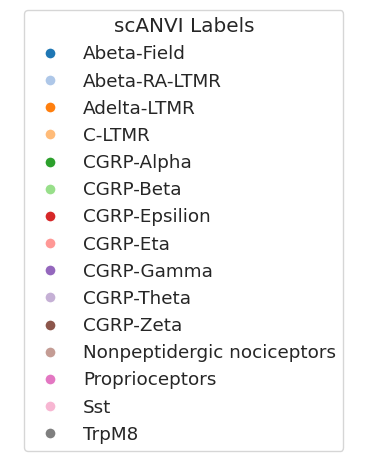

In [104]:
# Use same color_map from above
fig, ax = plt.subplots(figsize=(4, len(labels_sorted) * 0.3))

handles = [
    plt.Line2D([0], [0], marker='o', color='w', label=lab,
               markerfacecolor=color_map[lab], markersize=8)
    for lab in labels_sorted
]

ax.legend(
    handles=handles,
    loc='center',
    frameon=True,
    facecolor='white',
    edgecolor="#cccccc",
    title="scANVI Labels"
)
ax.axis("off")
plt.tight_layout()
plt.show()

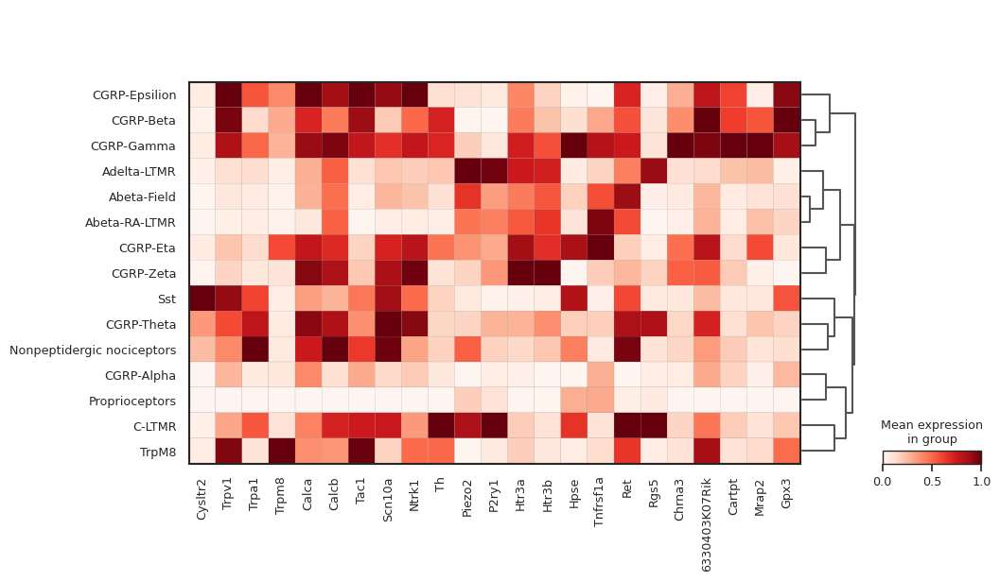

In [216]:
genes = ['Cysltr2', 'Trpv1', 'Trpa1', 'Trpm8', 'Calca', 'Calcb', 'Tac1', 'Scn10a', 'Ntrk1', 'Th', 'Piezo2', 'P2ry1', 'Htr3a', 'Htr3b', 'Hpse', 'Tnfrsf1a', 'Ret', 'Rgs5',
        'Chrna3', '6330403K07Rik', 'Cartpt', 'Mrap2', 'Gpx3']
sc.pl.matrixplot(bdata, var_names = genes, groupby = 'scanvi_labels', standard_scale = 'var', dendrogram = True, use_raw = False, cmap = 'Reds')

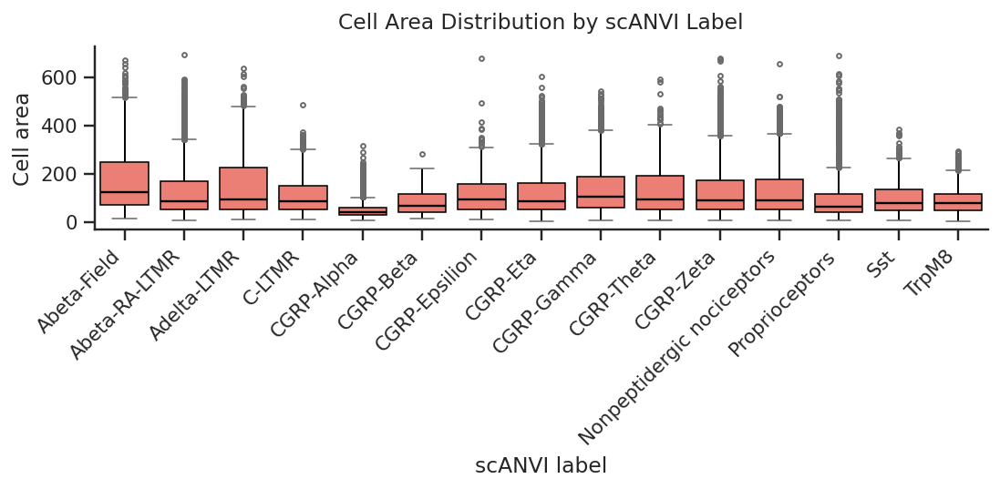

In [217]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 4), dpi=140)
sns.set_theme(style="ticks")

# Create boxplot — shows median, Q1, Q3 (IQR), and whiskers
sns.boxplot(
    data=adata.obs,
    x="scanvi_labels",
    y="cell_area",
    color="#ff6f61",
    linewidth=0.8,
    fliersize=2.5,  # small outliers
    boxprops={"edgecolor": "black"},
    medianprops={"color": "black", "lw": 1.2},
    whiskerprops={"color": "black", "lw": 1},
)

plt.xticks(rotation=45, ha="right")
plt.xlabel("scANVI label")
plt.ylabel("Cell area")
plt.title("Cell Area Distribution by scANVI Label", pad=10)

sns.despine()
plt.tight_layout()
plt.show()

/tmp/ipykernel_7632/2656703081.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




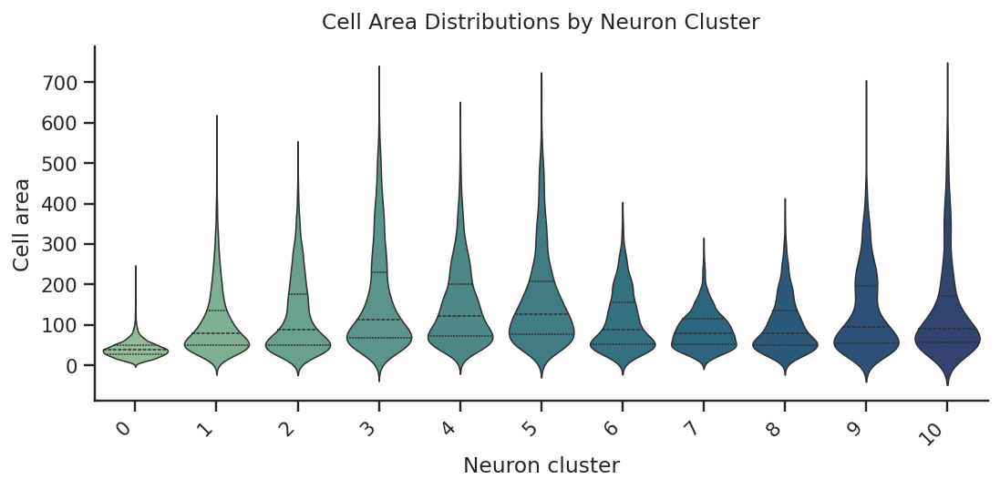

In [219]:
plt.figure(figsize=(8, 4), dpi=140)
sns.set_theme(style="ticks")

sns.violinplot(
    data=adata.obs,
    x="neuron_recluster",
    y="cell_area",
    inner="quartile",
    linewidth=0.8,
    palette="crest",
)

plt.xticks(rotation=45, ha="right")
plt.xlabel("Neuron cluster")
plt.ylabel("Cell area")
plt.title("Cell Area Distributions by Neuron Cluster", pad=10)

sns.despine()
plt.tight_layout()
plt.show()